In [1]:
# importing the required modules  
import json
from json import loads
from time import sleep
from json import dumps
from kafka import KafkaConsumer
import pandas as pd
from datetime import datetime
import os
import matplotlib.pyplot as plt
# import matplotlib
# matplotlib.use('Qt5Agg')


In [2]:
# Kafka Consumer  
trade_consumer = KafkaConsumer(  
    'successful_trade',  
     bootstrap_servers = ['localhost : 9092'],
     value_deserializer = lambda x : loads(x.decode('utf-8'))  
)


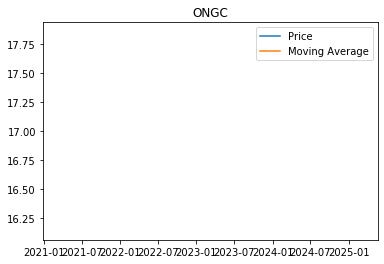

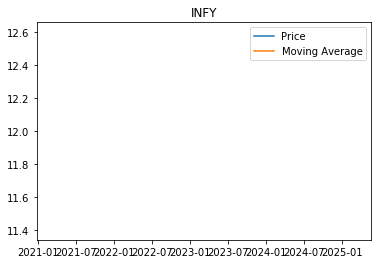

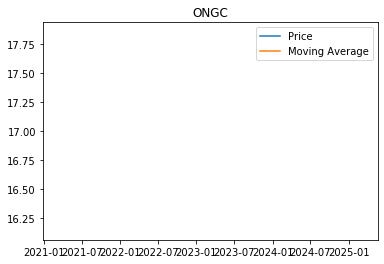

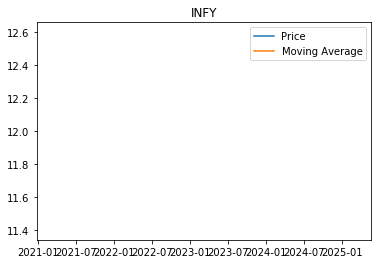

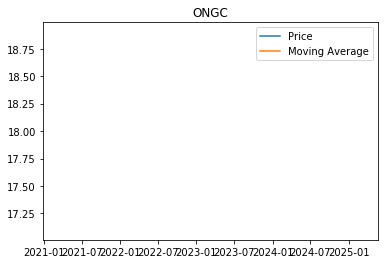

...

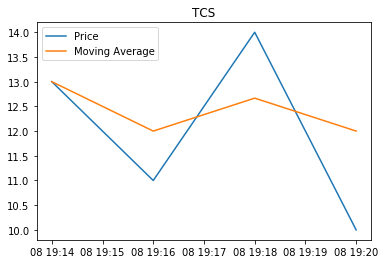

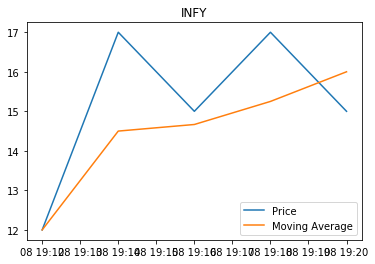

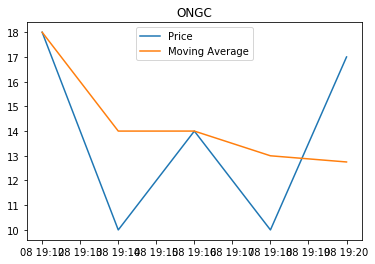

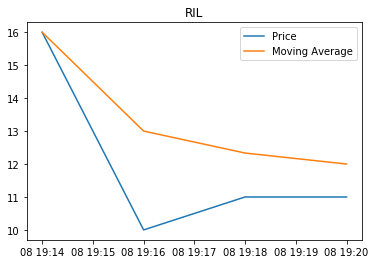

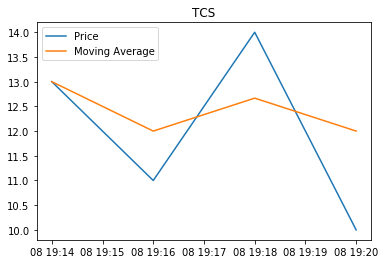

KeyboardInterrupt: 

In [3]:
# Calculate SMA on streaming data
plt.ion()
df = pd.DataFrame()

for message in trade_consumer:
    df_iter = pd.json_normalize(message.value)
    df_iter = df_iter.drop(["id", "id_sell", "quantity"], axis=1)
    df_iter['update_timestamp'] = pd.to_datetime(df_iter['update_timestamp'])
    df = df.append(
        df_iter, 
        ignore_index=True
    )
    resampled_data = df.groupby('instrument').resample(
        '2T', on='update_timestamp'
    ).last().drop(
        ["instrument", "update_timestamp"], axis=1
    )
    window_size = 4
    resampled_data["sma"] = resampled_data.groupby(["instrument"])["price"].transform(
        lambda x: x.rolling(window=window_size, min_periods=1).mean()
    )
    output_path = "outputs/sma_calc.csv"
    resampled_data.to_csv(
            output_path, 
            header=True,
        )
    
    # loop through each instrument and plot the data
    for instrument in resampled_data.index.levels[0]:
        # create a subplot for the instrument
        fig, ax = plt.subplots()
        # plt.clf()

        # filter the data for the current instrument
        instrument_data = resampled_data.loc[instrument]

        # plot the price data
        ax.plot(instrument_data.index, instrument_data['price'], label='Price')

        # plot the moving average data
        ax.plot(instrument_data.index, instrument_data["sma"], label='Moving Average')

        # set the title and legend for the subplot
        ax.set_title(instrument)
        ax.legend()
        
        # update the plot
        plt.show()
        



In [ ]:
# def update_sma_plot():
#     ax.clear()  # Clear the existing plot
#     for instrument, window in sliding_windows.items():
#         if instrument not in lines:
#             lines[instrument], = ax.plot(window.index.levels[0], window.values, label=instrument)
#         else:
#             lines[instrument].set_data(window.index.levels[0], window.values)
#     # sliding_window.plot(ax=ax, kind='line')  # Plot the sliding window
#     plt.title('Simple Moving Average')  # Set the plot title
#     plt.xlabel('update_timestamp')  # Set the x-axis label
#     plt.ylabel('sma')  # Set the y-axis label
#     plt.legend()
#     plt.draw()  # Redraw the plot
#     plt.pause(0.001)

In [ ]:
#     df['update_timestamp'] = pd.to_datetime(df['update_timestamp'])
#     df.set_index('update_timestamp', inplace=True)
#     resampled_data = df.groupby('instrument').resample('1T').mean()
#     window_size = 4
#     resampled_data["sma"] = resampled_data['price'].rolling(window_size).mean().shift(2)
#     resampled_data
    
    
#     sliding_windows = {}
#     for instrument, instrument_data in resampled_data.groupby('instrument'):
#         sliding_windows[instrument] = instrument_data['price'].rolling(window_size).mean().shift(2)
#     update_sma_plot()
    
    
#     resampled_data = df.groupby('instrument').resample('1T', on='update_timestamp').mean()
#     window_size = 4
#     sliding_window = resampled_data['price'].rolling(window_size).mean().shift(2)
#     update_sma_plot(sliding_window)




#     resampled_data["sma"] = resampled_data.groupby(["instrument"])["price"].transform(
#         lambda x: x.rolling(window=window_size, min_periods=1).mean().shift(2)
#     )
#     df['Close Price'].plot(figsize = (15, 8))
#     plt.grid()
#     plt.ylabel("Price in Rupees")
#     plt.show()
    # create 10mins simple moving average column
    # df["sma"] = df.groupby(["instrument"])["price"].transform(lambda x: x.rolling(3, 1).mean())
    # df['ma'] = df.groupby('store')['sales'].transform(lambda x: x.rolling(2, 1).mean())
    #df = (df.assign(moving_score=df.groupby(['instrument'], as_index=False)[['score']]
    #                       .rolling(2, min_periods=1).mean().fillna(0)
    #                       .reset_index(0, drop=True)))



In [ ]:
# # df.head(100)
# df["sma"] = df.groupby(["instrument"])["price"].transform(lambda x: x.rolling(window=3, min_periods=1).mean())
# df.sort_values(by=["instrument", "update_timestamp"])

In [ ]:
df_final

In [ ]:
df_tmp = pd.read_csv("outputs/successful_orders_1.csv")
df_tmp.head(2)
df_tmp = df_tmp.drop(["id", "id_sell", "quantity"], axis=1)

In [ ]:
df_tmp['update_timestamp'] = pd.to_datetime(df_tmp['update_timestamp'])
resampled_data = df_tmp.groupby('instrument').resample('1T', on='update_timestamp').last().drop(["instrument", "update_timestamp"], axis=1)
window_size = 4
resampled_data["sma"] = resampled_data.groupby(["instrument"])["price"].transform(
    lambda x: x.rolling(window=window_size, min_periods=1).mean()
)
resampled_data

# loop through each instrument and plot the data
for instrument in resampled_data.index.levels[0]:
    # create a subplot for the instrument
    fig, ax = plt.subplots()

    # filter the data for the current instrument
    instrument_data = resampled_data.loc[instrument]

    # plot the price data
    ax.plot(instrument_data.index, instrument_data['price'], label='Price')

    # filter the resampled data for the current instrument
    instrument_resampled_data = resampled_data.loc[instrument]

    # plot the moving average data
    ax.plot(instrument_resampled_data.index, instrument_resampled_data["sma"], label='Moving Average')

    # set the title and legend for the subplot
    ax.set_title(instrument)
    ax.legend()


In [ ]:
instrument_data

In [ ]:

# get closing price for each minute
df_tmp1 = df_tmp.drop(["id", "id_sell", "quantity"], axis=1)
df_tmp1['update_timestamp'] = pd.to_datetime(df_tmp['update_timestamp'])
resampled_data = df_tmp1.groupby('instrument').resample('1T', on='update_timestamp').mean()
# resampled_data

window_size = 3
# sliding_window = resampled_data['price'].rolling(window_size).mean().shift(1)
resampled_data["sma"] = resampled_data.groupby(["instrument"])["price"].transform(
    lambda x: x.rolling(window=window_size, min_periods=1).mean().shift(1)
)
resampled_data


In [ ]:
# df.head(100)
# df_tmp["sma"] = df_tmp.groupby(["instrument"])["price"].transform(lambda x: x.rolling(window=3, min_periods=1).mean())
# df_tmp.sort_values(by=["instrument", "update_timestamp"])

# # Define the rolling window size and resampling interval
# window_size = '10T'
# interval = '5T'

# # Loop over the Kafka messages and perform the rolling window calculation and resampling
# for message in consumer:
#     # Add the incoming data to the DataFrame
#     data = data.append({'timestamp': pd.to_datetime(message.value['timestamp']), 'value': message.value['value']}, ignore_index=True)
#     # Calculate the rolling mean for the 10 minute window
#     rolling_mean = data['value'].rolling(window_size).mean().iloc[-1]
#     # Resample the data into 5 minute intervals and calculate the mean
#     resampled_data = data.resample(interval, on='timestamp').mean()
#     # Send the resampled data to the destination topic
#     for idx, row in resampled_data.iterrows():
#         producer.send('destination_topic', {'timestamp': idx.to_pydatetime().strftime('%Y-%m-%d %H:%M:%S'), 'value': row['value'], 'rolling_mean': rolling_mean})
#     # Wait for 5 minutes before processing the next batch of data
#     time.sleep(300)


In [ ]:
# Calculate the rolling mean for the 10 minute window
# df_tmp['update_timestamp'] = pd.to_datetime(df_tmp["update_timestamp"])
# rolling_mean = df_tmp['price'].rolling(1).mean().iloc[-1]

# resampled_data = df_tmp.groupby('instrument').resample('1T', on='update_timestamp')['price'].mean().unstack('instrument')
# resampled_data
